In [1]:
# from datasets import load_dataset
# ds = load_dataset(
#     "parquet",
#     data_files="/mnt/scratch/legacysurvey_hsc_crossmatched/data/*.parquet",
#     split="train",
# )
# print(ds)

In [2]:
from datasets import load_dataset
import glob

first_file = sorted(glob.glob("/mnt/scratch/legacysurvey_hsc_crossmatched/data/*.parquet"))[0]
ds = load_dataset("parquet", data_files=first_file, split="train")
print(ds)

/root/miniconda3/envs/rocm-py311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Dataset({
    features: ['z_cmodel_mag', 'z_sdssshape_shape12', 'a_g', 'a_r', 'y_sdssshape_psf_shape11', 'FLUX_R', 'FLUX_W3', 'i_cmodel_mag', 'z_sdssshape_shape22', 'legacysurvey_object_id', 'hsc_object_id', 'r_sdssshape_psf_shape11', 'legacysurvey_image', 'hsc_image', 'z_extendedness_value', 'r_cmodel_mag', 'i_sdssshape_shape11', 'i_sdssshape_shape12', 'y_sdssshape_psf_shape12', 'catalog', 'g_sdssshape_shape11', 'a_i', 'y_cmodel_mag', 'rgb', 'g_sdssshape_psf_shape11', 'g_sdssshape_shape12', 'y_sdssshape_psf_shape22', 'y_sdssshape_shape11', 'a_y', 'i_sdssshape_psf_shape12', 'g_sdssshape_shape22', 'object_mask', 'i_sdssshape_psf_shape11', 'r_sdssshape_psf_shape22', 'FLUX_W1', 'a_z', 'g_cmodel_mag', 'g_sdssshape_psf_shape12', 'SHAPE_E1', 'r_sdssshape_psf_shape12', 'EBV', 'g_extendedness_value', 'r_sdssshape_shape11', 'FLUX_I', 'i_sdssshape_shape22', 'y_sdssshape_shape22', 'blobmodel', 'y_extendedness_value', 'i_cmodel_magerr', 'z_cmodel_magerr', 'z_sdssshape_shape11', 'y_cmodel_magerr', 

In [3]:
im1=ds[0]['legacysurvey_image']
im2=ds[0]['hsc_image']

In [4]:
im1

{'band': ['des-g', 'des-r', 'des-i', 'des-z'],
 'flux': [[[0.0009046499617397785,
    0.0017771306447684765,
    -0.0007393286214210093,
    -0.0029709411319345236,
    -0.003281891345977783,
    0.0023771629203110933,
    -0.0001959211367648095,
    -0.0010208507301285863,
    -0.0014131158823147416,
    0.0006859077839180827,
    0.002178397262468934,
    0.0006504376651719213,
    -0.001568982726894319,
    -0.0032680921722203493,
    0.00029781420016661286,
    -0.0004111877642571926,
    -0.0008075865916907787,
    -0.000483072130009532,
    0.0014315942535176873,
    -0.00016929474077187479,
    -0.002511226572096348,
    0.0008374816388823092,
    0.002879663836210966,
    -0.0013619012897834182,
    0.0024493103846907616,
    0.0023878749925643206,
    -0.00035842007491737604,
    0.0005591586814261973,
    0.0014056563377380371,
    -0.0008080301340669394,
    -0.00013732808292843401,
    0.00025227994774468243,
    0.0013790494995191693,
    -0.0005202017491683364,
    0.0023

In [5]:
import numpy as np

In [6]:
im1_array=np.array(im1['flux'])

In [7]:
im1_array.shape

(4, 160, 160)

In [8]:
import matplotlib.pyplot as plt

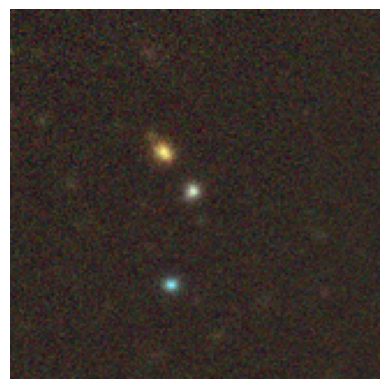

In [9]:
rgb = im1_array[0:3, :, :]


# Normalize each channel to [0,1]
rgb = (rgb - rgb.min(axis=(1,2), keepdims=True)) / \
      (rgb.max(axis=(1,2), keepdims=True) - rgb.min(axis=(1,2), keepdims=True) + 1e-8)

rgb=rgb.transpose(1, 2, 0)  # (160,160,3)
plt.imshow(rgb)
plt.axis("off")
plt.show()

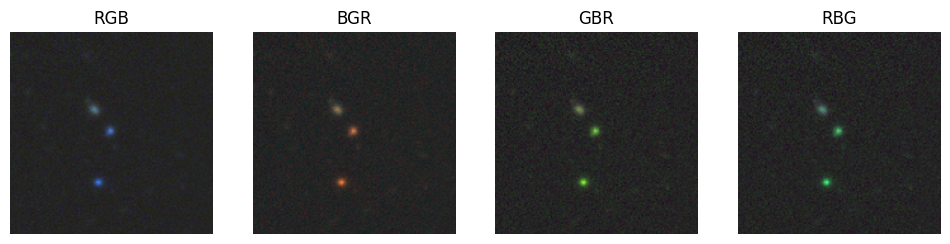

In [10]:
import matplotlib.pyplot as plt
import numpy as np

img_array = np.array(im1['flux'])[:3,:,:]  # (4,160,160)

# Normalize globally
def norm(x):
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

# Try different permutations of channels
orders = {
    "RGB": [0, 1, 2],
    "BGR": [2, 1, 0],
    "GBR": [1, 2, 0],
    "RBG": [0, 2, 1]
}

fig, axes = plt.subplots(1, 4, figsize=(12, 3))
for ax, (name, order) in zip(axes, orders.items()):
    rgb = img_array[order]
    rgb = norm(rgb)
    rgb = rgb.transpose(1, 2, 0)
    ax.imshow(rgb)
    ax.set_title(name)
    ax.axis("off")

plt.show()

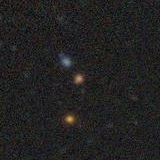

In [11]:
ds[0]['rgb']

im2_array.shape (5, 160, 160)


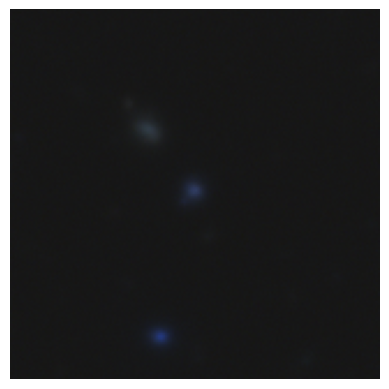

In [12]:
im2_array=np.array(im2['flux'])
im2_array.shape
print('im2_array.shape', im2_array.shape)

# Normalize each channel to [0,1]
im2_array_norm = norm(im2_array)

rgb_2 = im2_array_norm[0:3,:,:]

rgb_2=rgb_2.transpose(1, 2, 0)  # (160,160,3)
plt.imshow(rgb_2)
plt.axis("off")
plt.show()

In [13]:
ds[0]['object_mask'].shape

AttributeError: 'PngImageFile' object has no attribute 'shape'

In [ ]:
import torchvision.transforms.functional as F

# Assuming 'img' is your PIL object
img = ds[0]['object_mask']

# Converts to FloatTensor, scales to [0, 1], rearranges to (C, H, W)
tensor_mask = F.to_tensor(img)

print(tensor_mask.shape)

torch.Size([1, 160, 160])


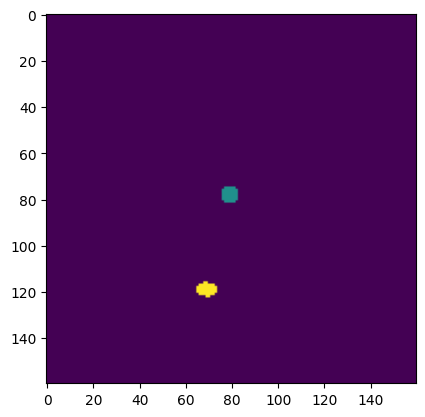

In [ ]:
plt.imshow(tensor_mask.numpy().squeeze(0))

object_mask <PIL.PngImagePlugin.PngImageFile image mode=L size=160x160 at 0x719C1C7D5A50>


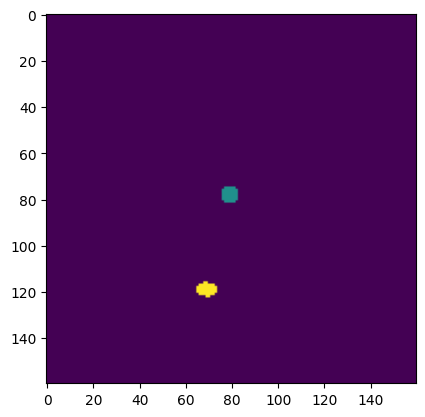

In [ ]:
object_mask = ds[0]['object_mask']

print('object_mask', object_mask)
# print('object_mask.shape', object_mask.shape)
# np.array(object_mask)

plt.imshow(object_mask)


In [ ]:
im2['band']

['hsc-g', 'hsc-r', 'hsc-i', 'hsc-z', 'hsc-y']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5544828957170583..1.0].


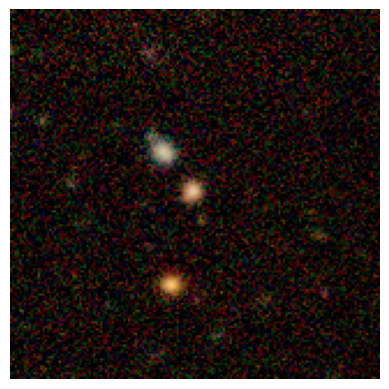

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6029085431351872..1.0].


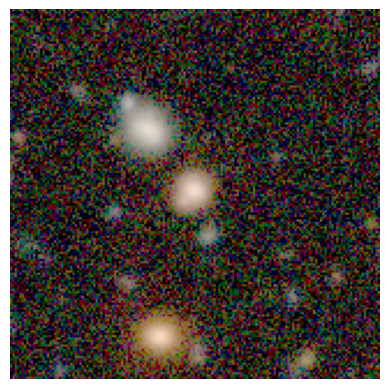

In [ ]:
import numpy as np

im1_array=np.array(im1['flux']) # g,r,i,z
im2_array=np.array(im2['flux']) # g,r,i,z


def make_rgb(g, r, i, Q=5, stretch=0.02):
    # Lupton transform for SDSS colors
    I = (r + g + i) / 3.0
    R = np.arcsinh(Q*(i)/stretch) / Q
    G = np.arcsinh(Q*(r)/stretch) / Q
    B = np.arcsinh(Q*(g)/stretch) / Q

    rgb = np.dstack([R, G, B])
    rgb /= np.max(rgb)  # normalize
    return rgb

im1_rgb = make_rgb(im1_array[0], im1_array[1], im1_array[2])
im2_rgb = make_rgb(im2_array[0], im2_array[1], im2_array[2])

plt.imshow(im1_rgb)
plt.axis("off")
plt.show()

plt.imshow(im2_rgb)
plt.axis("off")
plt.show()


In [61]:
max=0
min=0
for idx in range(256):
    min_value=np.array(ds[idx]['legacysurvey_image']['ivar']).min()
    max_value=np.array(ds[idx]['legacysurvey_image']['ivar']).max()
    if min_value<min:
        min=min_value
    if max_value>max:
        max=max_value
    print(idx)

print(min, max)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
0 734515.375


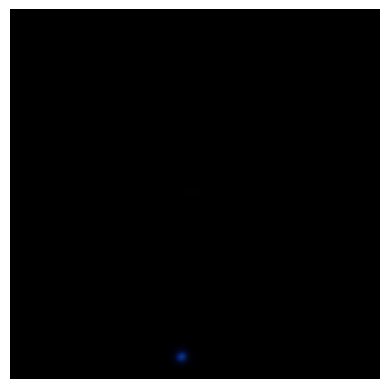

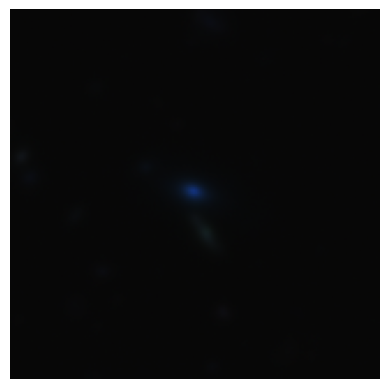

In [ ]:
im1=np.array(ds[107]['legacysurvey_image']['flux'])
im2=np.array(ds[107]['hsc_image']['flux'])
im1
im2
im1.shape
im2.shape

#Normalize each channel to [-1,1]
im1_norm = norm(im1)
im2_norm = norm(im2)

plt.imshow(im1_norm[:3,:,:].transpose(1, 2, 0))
plt.axis("off")
plt.show()

plt.imshow(im2_norm[:3,:,:].transpose(1, 2, 0))
plt.axis("off")
plt.show()